<a href="https://colab.research.google.com/github/arbi11/CEFC-2022/blob/main/Fat_Bidi_GRU_Rescaled_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction

In [1]:
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from time import time

Good to know what version of tensorflow we're using...

In [2]:
print(tf.version.VERSION)

2.9.2


We also need tensorboard enabled

In [3]:
%load_ext tensorboard

# Data Acquisition and Cleanup

In [4]:
for (name, (train_url, test_url)) in {
    'M6': ('https://docs.google.com/spreadsheets/d/e/2PACX-1vStmjk37Gyxo04Jh_cR0yu-My4Y2KfiXRzNqI9iztS1V5ezxepehbmQOYSNDsao3Sxrksxr5kH0NqBg/pub?gid=405256803&single=true&output=csv',
            'https://docs.google.com/spreadsheets/d/e/2PACX-1vTCx2G0k-SUnmQxg_9TuW-o-D5Z44itWiciuHIkbGXxHPjEPBxbRVP2TMdN7GxRQtkMkkUBUv_IrLXr/pub?gid=1464939435&single=true&output=csv'),
    'M19': ('https://docs.google.com/spreadsheets/d/e/2PACX-1vTX1O03TCJYomYg1QU6SpGi-OhR_V3Kkx1Xkc2JUpaWaLlztDSLMn6eFXyFmaVZrmRIJjGoqY5LkENP/pub?gid=1103714291&single=true&output=csv',
            'https://docs.google.com/spreadsheets/d/e/2PACX-1vQQFzZz0My7iSpzHtl2K2m-2oBCHT--nqaXZiPxct4sJO2CPQWiRD6HRA8AeJHHQkY6bcu9lxatiLaP/pub?gid=1992106649&single=true&output=csv'),
    'M27': ('https://docs.google.com/spreadsheets/d/e/2PACX-1vRdXKEhlJTJJ51CppTioNYQRU7Ehq1ENVg3AeUx62jmkCe8g1miMc7yjcHmqfWyjg3bfJtRoXN77Eb-/pub?gid=635614041&single=true&output=csv',
            'https://docs.google.com/spreadsheets/d/e/2PACX-1vSMECgV6ErVI3a0_8tK6ymGVtvmff_ADVvJ6THlVTv0sL2jn3KAFcTuU04zw2LCmMxPFdY1lEzbi_aB/pub?gid=1533844294&single=true&output=csv'),
    '20PNF1500': ('https://docs.google.com/spreadsheets/d/e/2PACX-1vTBWwGhiUQBhBTGz4DZqAwDaeVxbwxWJDJZpvWQLesTYLDD8ehmMC7OENkgzyohLrCxtcbEKvaABk4Y/pub?gid=1807288876&single=true&output=csv',
                  'https://docs.google.com/spreadsheets/d/e/2PACX-1vSMlA32y9eSewKWs5j3R6FVi5-eQcUhgCzpiLUXlF8adWgScy0lw5-imD6GM0SA_-sHVM8VCtIpYhSP/pub?gid=222833859&single=true&output=csv'),
  }.items():
  print(name)

  # *  Get rid of the 5 useless rows at the beginning of each file
  # *  Normalize the column names to 't', 'Hx', 'Bx', 'Hy', 'By', 'Hz', 'Bz'
  df = pd.read_csv(train_url, skiprows=5, usecols=range(1, 8))
  df.to_csv(f"{name}_train.csv", index=False)
  print(f"  train set: {df.shape}")

  df = pd.read_csv(test_url, skiprows=5, usecols=range(1, 8))
  df.rename(columns={'H x': 'Hx', 'B x': 'Bx', 'H y': 'Hy', 'B y': 'By', 'H z': 'Hz', 'B z': 'Bz'}, inplace=True)
  df.to_csv(f"{name}_test.csv", index=False)
  print(f"  test set:  {df.shape}")

print("\nDone")

M6
  train set: (2001, 7)
  test set:  (11766, 7)
M19
  train set: (2001, 7)
  test set:  (1178, 7)
M27
  train set: (2001, 7)
  test set:  (1178, 7)
20PNF1500
  train set: (2001, 7)
  test set:  (11766, 7)

Done


And the M6 dataset with 20000 data points...

In [5]:
df = pd.read_csv('https://docs.google.com/spreadsheets/d/e/2PACX-1vR4v2LZFBH-tn1nSFUkL8M3cOZSh1I1jQzXsoLyGtdt--hAgyfEYYk087pFB7iatP7FvJsdM9fvfzAG/pub?gid=1926006206&single=true&output=csv',
                 skiprows=5, usecols=range(1, 8))
df.to_csv("M6_train20000.csv", index=False)
print(f"M6 (20000 data point version): {df.shape}")
del df

M6 (20000 data point version): (20001, 7)


# Data Exploration and Visualization

## M6 (2000 data point version)

In [6]:
df = pd.read_csv('./M6_train.csv')
df

,t,Hx,Bx,Hy,By,Hz,Bz
0,0.0,0.000000,0.000000,0.000000e+00,0.000000e+00,0,0.000000e+00
1,0.1,0.005460,0.000075,-1.190000e-17,-2.860000e-17,0,3.172737e-315
2,0.2,0.024100,0.000329,1.640000e-14,2.480000e-16,0,3.172737e-315
3,0.3,0.042700,0.000584,1.820000e-12,-2.040000e-15,0,3.172737e-315
4,0.4,0.061300,0.000839,-2.310000e-14,-3.810000e-14,0,3.172737e-315
...,...,...,...,...,...,...,...
1996,199.6,26.553186,-0.238842,-4.110000e-10,-2.940000e-11,0,3.172737e-315
1997,199.7,27.205196,-0.188133,-3.350000e-10,-2.880000e-11,0,3.172737e-315
1998,199.8,27.729051,-0.137423,-2.390000e-10,-1.390000e-11,0,3.172737e-315
1999,199.9,28.159743,-0.086700,1.470000e-10,-1.010000e-11,0,3.172737e-315


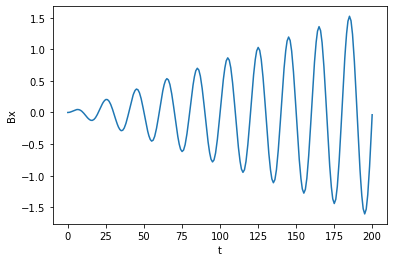

In [7]:
plt.plot(df['t'], df['Bx'], '-')
plt.xlabel('t')
plt.ylabel('Bx')
plt.show()

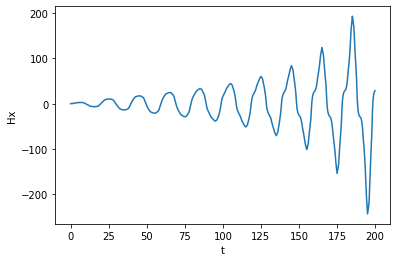

In [8]:
plt.plot(df['t'], df['Hx'])
plt.xlabel('t')
plt.ylabel('Hx')
plt.show()

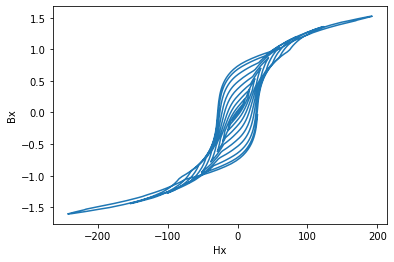

In [9]:
plt.plot(df['Hx'], df['Bx'])
plt.xlabel('Hx')
plt.ylabel('Bx')
plt.show()

## M6 (20000 data point version)

In [10]:
df = pd.read_csv('./M6_train20000.csv')
df

,t,Hx,Bx,Hy,By,Hz,Bz
0,0.00,0.000000,0.000000,0.000000e+00,0.000000e+00,0,0.0
1,0.01,0.000546,0.000007,-1.460000e-18,2.090000e-18,0,0.0
2,0.02,0.002410,0.000033,1.020000e-15,3.830000e-17,0,0.0
3,0.03,0.004280,0.000058,5.400000e-15,1.540000e-16,0,0.0
4,0.04,0.006140,0.000084,6.350000e-15,7.590000e-17,0,0.0
...,...,...,...,...,...,...,...
19996,199.96,7.536977,-0.023900,-1.470000e-09,-6.500000e-11,0,0.0
19997,199.97,7.799354,-0.018800,-1.430000e-09,-6.470000e-11,0,0.0
19998,199.98,8.057725,-0.013800,-1.400000e-09,-6.450000e-11,0,0.0
19999,199.99,8.312216,-0.008700,-1.370000e-09,-6.480000e-11,0,0.0


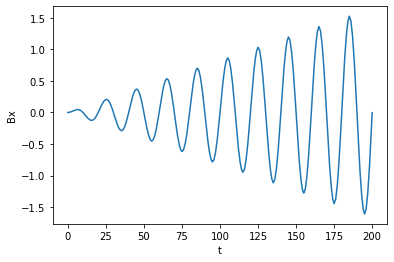

In [11]:
plt.plot(df['t'], df['Bx'], '-')
plt.xlabel('t')
plt.ylabel('Bx')
plt.show()

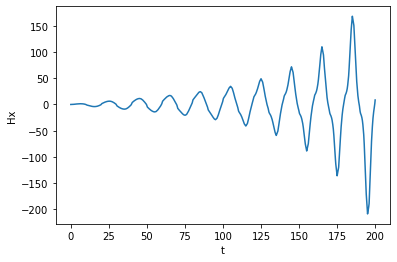

In [12]:
plt.plot(df['t'], df['Hx'])
plt.xlabel('t')
plt.ylabel('Hx')
plt.show()

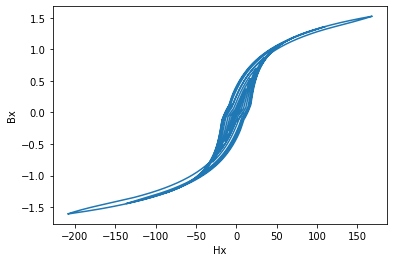

In [13]:
plt.plot(df['Hx'], df['Bx'])
plt.xlabel('Hx')
plt.ylabel('Bx')
plt.show()

## M19

In [14]:
df = pd.read_csv('./M19_train.csv')
df

,t,Hx,Bx,Hy,By,Hz,Bz
0,0.0,0.000000,0.000000,0.000000e+00,0.000000e+00,0,3.234392e-317
1,0.1,0.016100,0.000075,4.930000e-18,-4.960000e-18,0,3.231985e-315
2,0.2,0.070900,0.000329,1.070000e-14,6.050000e-16,0,3.231985e-315
3,0.3,0.125582,0.000584,-6.320000e-12,-1.900000e-14,0,3.231985e-315
4,0.4,0.180231,0.000838,-7.490000e-13,7.610000e-15,0,3.231985e-315
...,...,...,...,...,...,...,...
1996,199.6,54.128872,-0.238981,-4.310000e-10,-1.650000e-11,0,3.231985e-315
1997,199.7,55.785869,-0.188277,-6.320000e-10,-1.970000e-11,0,3.231985e-315
1998,199.8,56.959727,-0.137570,-7.640000e-10,-1.890000e-11,0,3.231985e-315
1999,199.9,57.788775,-0.086900,-6.110000e-10,-1.910000e-11,0,3.231985e-315


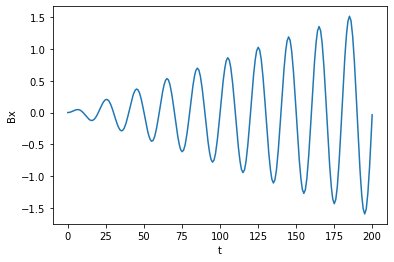

In [15]:
plt.plot(df['t'], df['Bx'])
plt.xlabel('t')
plt.ylabel('Bx')
plt.show()

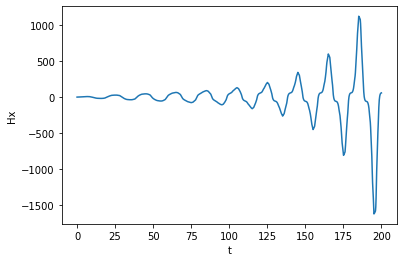

In [16]:
plt.plot(df['t'], df['Hx'])
plt.xlabel('t')
plt.ylabel('Hx')
plt.show()

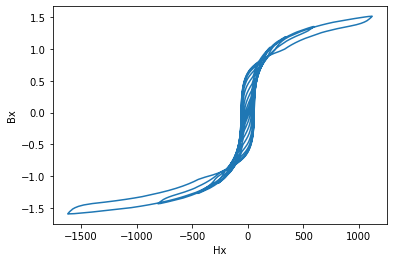

In [17]:
plt.plot(df['Hx'], df['Bx'])
plt.xlabel('Hx')
plt.ylabel('Bx')
plt.show()

## M27

In [18]:
df = pd.read_csv('./M27_train.csv')
df

,t,Hx,Bx,Hy,By,Hz,Bz
0,0.0,0.000000,0.000000,0.000000e+00,0.000000e+00,0,0.000000e+00
1,0.1,0.029800,0.000074,5.050000e-17,-1.030000e-17,0,3.173707e-315
2,0.2,0.131281,0.000329,-1.940000e-14,-1.540000e-15,0,3.173707e-315
3,0.3,0.232548,0.000583,2.660000e-12,5.720000e-16,0,3.173707e-315
4,0.4,0.333579,0.000837,1.590000e-12,-3.440000e-16,0,3.173707e-315
...,...,...,...,...,...,...,...
1996,199.6,83.234273,-0.239127,1.010000e-09,1.200000e-11,0,3.173707e-315
1997,199.7,84.088881,-0.188419,2.940000e-10,1.080000e-11,0,3.173707e-315
1998,199.8,84.683009,-0.137710,4.460000e-10,1.200000e-11,0,3.173707e-315
1999,199.9,85.103368,-0.087000,2.890000e-10,1.200000e-11,0,3.173707e-315


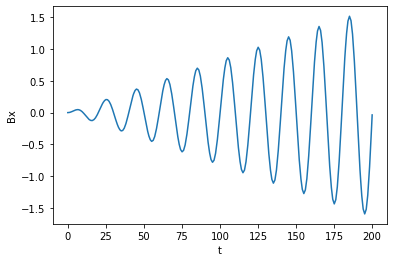

In [19]:
plt.plot(df['t'], df['Bx'], '-')
plt.xlabel('t')
plt.ylabel('Bx')
plt.show()

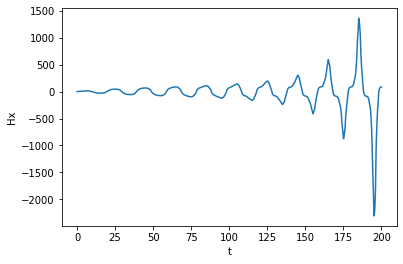

In [20]:
plt.plot(df['t'], df['Hx'])
plt.xlabel('t')
plt.ylabel('Hx')
plt.show()

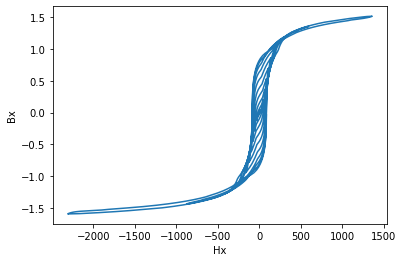

In [21]:
plt.plot(df['Hx'], df['Bx'])
plt.xlabel('Hx')
plt.ylabel('Bx')
plt.show()

## 20PNF1500

In [22]:
df = pd.read_csv('./20PNF1500_train.csv')
df

,t,Hx,Bx,Hy,By,Hz,Bz
0,0.0,0.000000,0.000000,0.000000e+00,0.000000e+00,0,0.000000e+00
1,0.1,0.008970,0.000075,2.070000e-18,2.190000e-17,0,3.332685e-315
2,0.2,0.039600,0.000329,-2.010000e-14,-8.070000e-16,0,3.332685e-315
3,0.3,0.070200,0.000584,-1.240000e-12,1.240000e-14,0,3.332685e-315
4,0.4,0.100677,0.000839,2.140000e-12,3.780000e-14,0,3.332685e-315
...,...,...,...,...,...,...,...
1996,199.6,24.903787,-0.238834,-7.050000e-10,-1.320000e-11,0,3.332685e-315
1997,199.7,26.197892,-0.188128,-7.090000e-10,-1.350000e-11,0,3.332685e-315
1998,199.8,27.139616,-0.137420,-6.050000e-10,-9.640000e-12,0,3.332685e-315
1999,199.9,27.827180,-0.086700,-1.980000e-10,-8.510000e-12,0,3.332685e-315


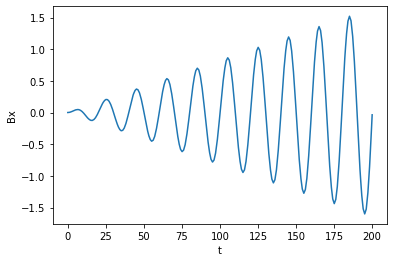

In [23]:
plt.plot(df['t'], df['Bx'], '-')
plt.xlabel('t')
plt.ylabel('Bx')
plt.show()

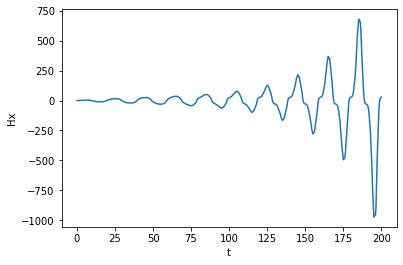

In [24]:
plt.plot(df['t'], df['Hx'])
plt.xlabel('t')
plt.ylabel('Hx')
plt.show()

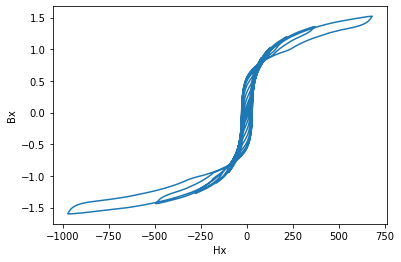

In [25]:
plt.plot(df['Hx'], df['Bx'])
plt.xlabel('Hx')
plt.ylabel('Bx')
plt.show()

# Training and Testing Sets

In this one, we do one extra thing, which is to one-hot encoding them as follows:

 Material | Pattern
----------|--------
M6        | 1000
M19       | 0100
M27       | 0010
20PNF1500 | 0001

In [26]:
def generate_timesteps(df, offset, window=1, max_offs=4):
  assert window > 0
  assert 0 <= offset < max_offs

  y = np.zeros((len(df), window, 1))
  x = np.zeros((len(df), window, 2 + max_offs))

  for w in range(window):
    y[w:, window - w - 1, 0] = df['Bx'][:len(df) - w]

  for w in range(window):
    x[w:, window - w - 1, 0] = df['Hx'][:len(df) - w]

  for w in range(window):
    x[w + 1:, window - w - 1, 1] = df['Bx'][:len(df) - w - 1]

  x[:, :, 2 + offset] = 1

  return (x, y[:, -1, :])

## M6 (2000 data point version)

In [27]:
(M6_train_X, M6_train_Y) = generate_timesteps(pd.read_csv('./M6_train.csv'), offset=3, window=30)
(M6_test_X, M6_test_Y)   = generate_timesteps(pd.read_csv('./M6_test.csv'), offset=3, window=30)

print("Training Set")
print(f"  X: {M6_train_X.shape}")
print(f"  Y: {M6_train_Y.shape}")

print("Testing Set")
print(f"  X: {M6_test_X.shape}")
print(f"  Y: {M6_test_Y.shape}")

Training Set
  X: (2001, 30, 6)
  Y: (2001, 1)
Testing Set
  X: (11766, 30, 6)
  Y: (11766, 1)


## M6 (20000 data point version)

In [28]:
(M6_20000_train_X, M6_20000_train_Y) = generate_timesteps(pd.read_csv('./M6_train20000.csv'), offset=3, window=30)

print("Training Set")
print(f"  X: {M6_20000_train_X.shape}")
print(f"  Y: {M6_20000_train_Y.shape}")

Training Set
  X: (20001, 30, 6)
  Y: (20001, 1)


## M19

In [29]:
(M19_train_X, M19_train_Y) = generate_timesteps(pd.read_csv('./M19_train.csv'), offset=2, window=30)
(M19_test_X, M19_test_Y)   = generate_timesteps(pd.read_csv('./M19_test.csv'), offset=2, window=30)

print("Training Set")
print(f"  X: {M19_train_X.shape}")
print(f"  Y: {M19_train_Y.shape}")

print("Testing Set")
print(f"  X: {M19_test_X.shape}")
print(f"  Y: {M19_test_Y.shape}")

Training Set
  X: (2001, 30, 6)
  Y: (2001, 1)
Testing Set
  X: (1178, 30, 6)
  Y: (1178, 1)


## M27

In [30]:
(M27_train_X, M27_train_Y) = generate_timesteps(pd.read_csv('./M27_train.csv'), offset=1, window=30)
(M27_test_X, M27_test_Y)   = generate_timesteps(pd.read_csv('./M27_test.csv'), offset=1, window=30)

print("Training Set")
print(f"  X: {M27_train_X.shape}")
print(f"  Y: {M27_train_Y.shape}")

print("Testing Set")
print(f"  X: {M27_test_X.shape}")
print(f"  Y: {M27_test_Y.shape}")

Training Set
  X: (2001, 30, 6)
  Y: (2001, 1)
Testing Set
  X: (1178, 30, 6)
  Y: (1178, 1)


## 20PNF1500

In [31]:
(_20PNF1500_train_X, _20PNF1500_train_Y) = generate_timesteps(pd.read_csv('./20PNF1500_train.csv'), offset=0, window=30)
(_20PNF1500_test_X, _20PNF1500_test_Y)   = generate_timesteps(pd.read_csv('./20PNF1500_test.csv'), offset=0, window=30)

print("Training Set")
print(f"  X: {_20PNF1500_train_X.shape}")
print(f"  Y: {_20PNF1500_train_Y.shape}")

print("Testing Set")
print(f"  X: {_20PNF1500_test_X.shape}")
print(f"  Y: {_20PNF1500_test_Y.shape}")

Training Set
  X: (2001, 30, 6)
  Y: (2001, 1)
Testing Set
  X: (11766, 30, 6)
  Y: (11766, 1)


## Squashed

In [32]:
Squashed_train_X = np.concatenate([
    M6_train_X,
    # M6_20000_train_X,
    M19_train_X,
    M27_train_X,
    _20PNF1500_train_X
])

Squashed_train_Y = np.concatenate([
    M6_train_Y,
    # M6_20000_train_Y,
    M19_train_Y,
    M27_train_Y,
    _20PNF1500_train_Y
])

Squashed_test_X = np.concatenate([
    M6_test_X,
    M19_test_X,
    M27_test_X,
    _20PNF1500_test_X
])

Squashed_test_Y = np.concatenate([
    M6_test_Y,
    M19_test_Y,
    M27_test_Y,
    _20PNF1500_test_Y
])

print("Squashed Training Set")
print(f"  X: {Squashed_train_X.shape}")
print(f"  Y: {Squashed_train_Y.shape}")
print("Squashed Testing Set")
print(f"  X: {Squashed_test_X.shape}")
print(f"  Y: {Squashed_test_Y.shape}")

Squashed Training Set
  X: (8004, 30, 6)
  Y: (8004, 1)
Squashed Testing Set
  X: (25888, 30, 6)
  Y: (25888, 1)


# ML Models

## GRU1

In [33]:
def new_model_gru1():
  input = tf.keras.Input(shape=(None, 6))

  x = tf.keras.layers.GRU(32, return_sequences=True)(input)
  x = tf.keras.layers.Bidirectional(
        tf.keras.layers.GRU(1),
        merge_mode='ave')(x)

  model = tf.keras.Model(input, x)
  return model

new_model_gru1().summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None, 6)]         0         
                                                                 
 gru (GRU)                   (None, None, 32)          3840      
                                                                 
 bidirectional (Bidirectiona  (None, 1)                210       
 l)                                                              
                                                                 
Total params: 4,050
Trainable params: 4,050
Non-trainable params: 0
_________________________________________________________________


# Model Utilities

In [34]:
def compile_and_fit(model, checkpoint,
                    train_X, train_Y,
                    validate_X, validate_Y,
                    epochs=1000,
                    patience=10,
                    min_delta=0,
                    batch_size=50,
                    seed=9763):
  if seed is not None:
    np.random.seed(seed)
    tf.random.set_seed(seed)

  model.compile(loss='mse', optimizer='adam')
  callbacks = [
      tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                       mode='auto',
                                       verbose=0,
                                       min_delta=min_delta,
                                       patience=patience),
      tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint,
                                         monitor='val_loss',
                                         save_best_only=True),
      tf.keras.callbacks.TensorBoard(log_dir='/content')
  ]

  # sneaky normalization
  train_X = np.array(train_X, copy=True)
  train_Y = np.array(train_Y, copy=True)
  train_X[:, :, 1] /= 1.5
  train_Y /= 1.5
  np.clip(train_Y, -1, 1, out=train_Y)

  validate_X = np.array(validate_X, copy=True)
  validate_Y = np.array(validate_Y, copy=True)
  validate_X[:, :, 1] /= 1.5
  validate_Y /= 1.5

  return model.fit(train_X, train_Y,
                   epochs=epochs,
                   batch_size=batch_size,
                   callbacks=callbacks,
                   validation_data=(validate_X, validate_Y))

In [35]:
def plot_train_stats(history):
  plt.plot(history.history['loss'], label='train loss')
  plt.plot(history.history['val_loss'], label='val loss')
  plt.xlabel('Epoch')
  plt.ylabel('MSE')
  plt.legend()
  plt.show()

In [36]:
def plot_predictions(pred, actual, **kwargs):
  (fig, ax) = plt.subplots(2, sharex=True, **kwargs)

  ax[0].plot(actual, label='expected')
  ax[0].plot(pred, label='prediction')
  ax[0].set_ylabel('Bx')
  ax[0].legend()

  ax[1].plot(np.abs(actual - pred))
  ax[1].set_ylabel('delta')
  ax[1].grid()

  plt.xlabel('t')
  plt.show()

  print(f"MSE: {np.square(actual - pred).mean()}")

In [37]:
def inference_loop(model, data_X):
  data_X = np.array(data_X, copy=True)

  # sneaky normalization
  data_X[:, :, 1] /= 1.5

  y = np.empty(len(data_X))
  print(f"Start inference loop on {len(data_X)} samples...", end="")
  start = time()
  for i in range(len(data_X) - 1):
    y[i] = model.predict(data_X[i, None]).flatten()[-1]

    data_X[i + 1, :-1, 1] = data_X[i, 1:, 1]
    data_X[i + 1, -1, 1] = y[i]

  i = len(data_X) - 1
  y[i] = model.predict(data_X[i, None]).flatten()[-1]
  end = time()
  print(f" DONE after {end - start}s")
  return y.reshape((-1, 1)) * 1.5   # undo Bx normalization

# Model Performance

## GRU1

### Training

Epoch 1/1000
161/161 [==============================] - ETA: 0s - loss: 0.0487

161/161 [==============================] - 35s 177ms/step - loss: 0.0487 - val_loss: 0.0199
Epoch 2/1000
160/161 [============================>.] - ETA: 0s - loss: 0.0109

161/161 [==============================] - 29s 179ms/step - loss: 0.0109 - val_loss: 0.0098
Epoch 3/1000
160/161 [============================>.] - ETA: 0s - loss: 0.0047

161/161 [==============================] - 27s 170ms/step - loss: 0.0047 - val_loss: 0.0076
Epoch 4/1000
161/161 [==============================] - ETA: 0s - loss: 0.0032

161/161 [==============================] - 27s 169ms/step - loss: 0.0032 - val_loss: 0.0066
Epoch 5/1000
161/161 [==============================] - 9s 55ms/step - loss: 0.0024 - val_loss: 0.0072
Epoch 6/1000
160/161 [============================>.] - ETA: 0s - loss: 0.0020

161/161 [==============================] - 26s 165ms/step - loss: 0.0020 - val_loss: 0.0061
Epoch 7/1000
161/161 [==============================] - 9s 57ms/step - loss: 0.0017 - val_loss: 0.0062
Epoch 8/1000
160/161 [============================>.] - ETA: 0s - loss: 0.0015

161/161 [==============================] - 27s 167ms/step - loss: 0.0015 - val_loss: 0.0051
Epoch 9/1000
161/161 [==============================] - 9s 56ms/step - loss: 0.0013 - val_loss: 0.0055
Epoch 10/1000
161/161 [==============================] - 9s 58ms/step - loss: 0.0012 - val_loss: 0.0055
Epoch 11/1000
161/161 [==============================] - 9s 59ms/step - loss: 0.0010 - val_loss: 0.0053
Epoch 12/1000
161/161 [==============================] - 11s 66ms/step - loss: 9.2698e-04 - val_loss: 0.0051
Epoch 13/1000
161/161 [==============================] - 11s 67ms/step - loss: 8.5401e-04 - val_loss: 0.0051
Epoch 14/1000
160/161 [============================>.] - ETA: 0s - loss: 7.3915e-04

161/161 [==============================] - 28s 174ms/step - loss: 7.3888e-04 - val_loss: 0.0040
Epoch 15/1000
161/161 [==============================] - 10s 60ms/step - loss: 6.7167e-04 - val_loss: 0.0045
Epoch 16/1000
161/161 [==============================] - ETA: 0s - loss: 5.3268e-04

161/161 [==============================] - 27s 168ms/step - loss: 5.3268e-04 - val_loss: 0.0038
Epoch 17/1000
161/161 [==============================] - 9s 55ms/step - loss: 5.8375e-04 - val_loss: 0.0039
Epoch 18/1000
161/161 [==============================] - 9s 56ms/step - loss: 4.0426e-04 - val_loss: 0.0044
Epoch 19/1000
161/161 [==============================] - ETA: 0s - loss: 3.6962e-04

161/161 [==============================] - 26s 164ms/step - loss: 3.6962e-04 - val_loss: 0.0035
Epoch 20/1000
161/161 [==============================] - 9s 55ms/step - loss: 3.3472e-04 - val_loss: 0.0041
Epoch 21/1000
160/161 [============================>.] - ETA: 0s - loss: 3.1785e-04

161/161 [==============================] - 27s 166ms/step - loss: 3.1771e-04 - val_loss: 0.0033
Epoch 22/1000
161/161 [==============================] - 10s 65ms/step - loss: 3.2336e-04 - val_loss: 0.0035
Epoch 23/1000
161/161 [==============================] - 9s 57ms/step - loss: 2.8046e-04 - val_loss: 0.0034
Epoch 24/1000
161/161 [==============================] - 9s 57ms/step - loss: 2.8818e-04 - val_loss: 0.0034
Epoch 25/1000
161/161 [==============================] - ETA: 0s - loss: 3.6864e-04

161/161 [==============================] - 26s 161ms/step - loss: 3.6864e-04 - val_loss: 0.0031
Epoch 26/1000
161/161 [==============================] - 11s 65ms/step - loss: 2.8814e-04 - val_loss: 0.0034
Epoch 27/1000
161/161 [==============================] - 9s 56ms/step - loss: 2.6540e-04 - val_loss: 0.0036
Epoch 28/1000
161/161 [==============================] - 10s 65ms/step - loss: 3.1394e-04 - val_loss: 0.0035
Epoch 29/1000
161/161 [==============================] - 9s 56ms/step - loss: 2.1708e-04 - val_loss: 0.0032
Epoch 30/1000
161/161 [==============================] - 9s 56ms/step - loss: 2.0508e-04 - val_loss: 0.0033
Epoch 31/1000
160/161 [============================>.] - ETA: 0s - loss: 2.3510e-04

161/161 [==============================] - 26s 162ms/step - loss: 2.3500e-04 - val_loss: 0.0030
Epoch 32/1000
160/161 [============================>.] - ETA: 0s - loss: 2.5741e-04

161/161 [==============================] - 26s 164ms/step - loss: 2.5748e-04 - val_loss: 0.0029
Epoch 33/1000
161/161 [==============================] - 9s 56ms/step - loss: 2.2070e-04 - val_loss: 0.0030
Epoch 34/1000
161/161 [==============================] - 9s 55ms/step - loss: 1.9974e-04 - val_loss: 0.0034
Epoch 35/1000
161/161 [==============================] - 9s 55ms/step - loss: 2.3019e-04 - val_loss: 0.0043
Epoch 36/1000
161/161 [==============================] - 9s 56ms/step - loss: 4.0421e-04 - val_loss: 0.0042
Epoch 37/1000
161/161 [==============================] - 9s 55ms/step - loss: 2.8750e-04 - val_loss: 0.0030
Epoch 38/1000
161/161 [==============================] - 9s 56ms/step - loss: 2.0984e-04 - val_loss: 0.0032
Epoch 39/1000
161/161 [==============================] - 9s 55ms/step - loss: 2.4481e-04 - val_loss: 0.0034
Epoch 40/1000
161/161 [==============================] - 9s 55ms/step - loss: 1.8068e-04 - val_loss: 0.0034
Epoch 41/1000
161/161 [=================

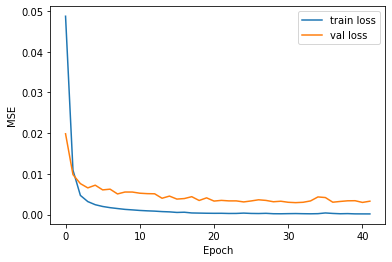

In [38]:
model = new_model_gru1()
history = compile_and_fit(model, './Model_GRU1_Squashed',
                          Squashed_train_X, Squashed_train_Y,
                          Squashed_test_X, Squashed_test_Y)
plot_train_stats(history)
del model, history

In [39]:
%tensorboard --logdir /content

<IPython.core.display.Javascript object>

### M6 (2000 data point version)

1/1 [==============================] - 0s 27ms/step
 DONE after 156.81017208099365s


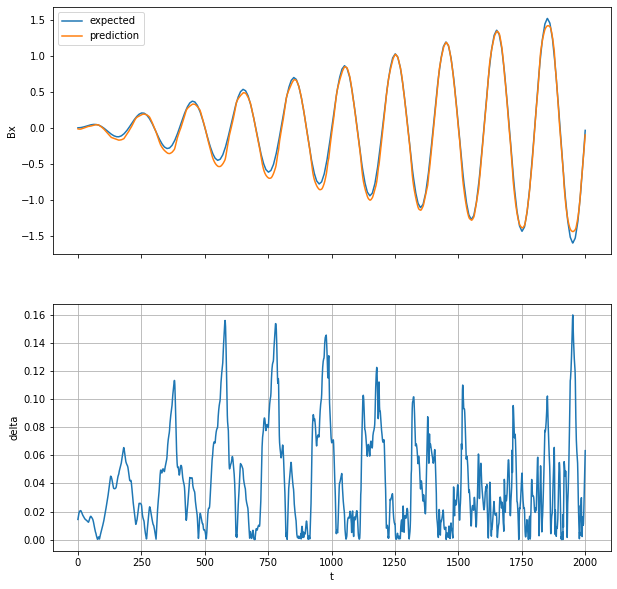

In [40]:
model = tf.keras.models.load_model('./Model_GRU1_Squashed')
pred = inference_loop(model, M6_train_X)
del model

plot_predictions(pred, M6_train_Y, figsize=(10, 10))

MSE: 0.0029108192096963426


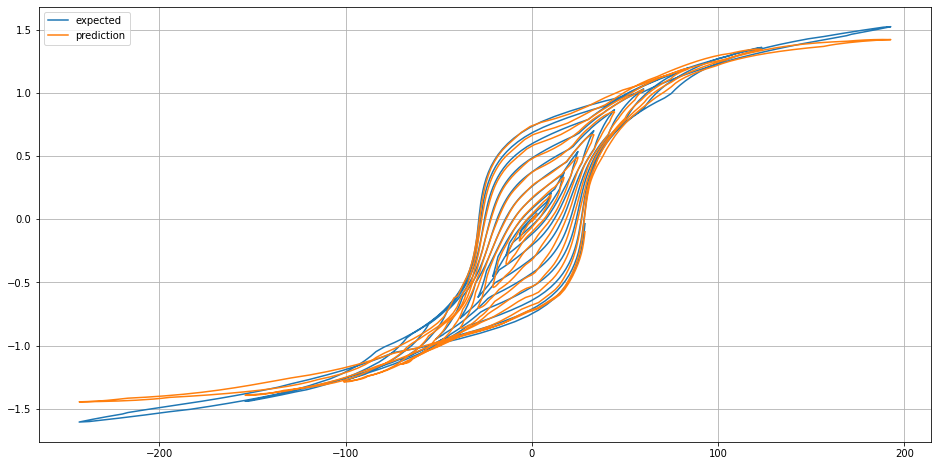

In [41]:
plt.figure(figsize=(16, 8))
plt.plot(M6_train_X[:, -1, 0], M6_train_Y, label='expected')
plt.plot(M6_train_X[:, -1, 0], pred, label='prediction')
plt.grid()
plt.legend()
plt.show()

Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 32ms/step
 DONE after 1126.8099620342255s


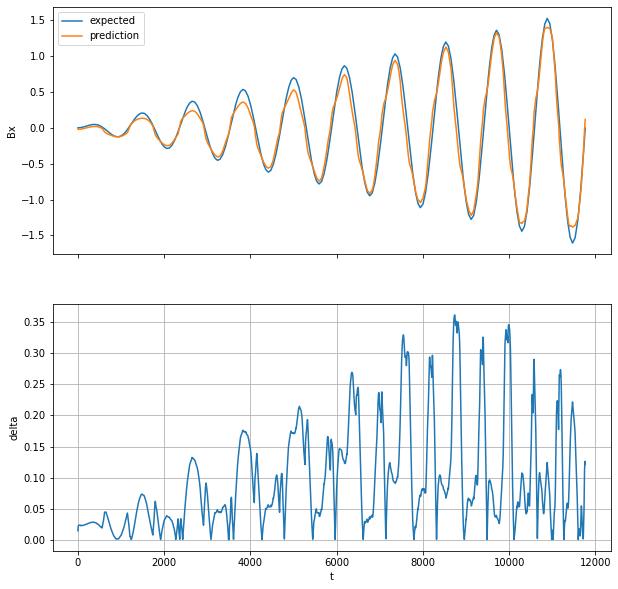

MSE: 0.01639925904968912


In [42]:
model = tf.keras.models.load_model('./Model_GRU1_Squashed')
pred = inference_loop(model, M6_test_X)
del model

plot_predictions(pred, M6_test_Y, figsize=(10, 10))

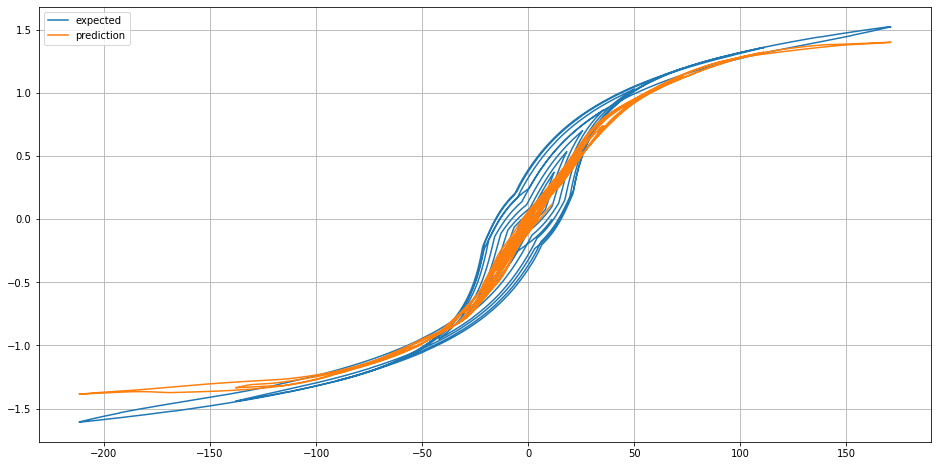

In [43]:
plt.figure(figsize=(16, 8))
plt.plot(M6_test_X[:, -1, 0], M6_test_Y, label='expected')
plt.plot(M6_test_X[:, -1, 0], pred, label='prediction')
plt.grid()
plt.legend()
plt.show()

### M19

1/1 [==============================] - 0s 26ms/step
 DONE after 187.78560590744019s


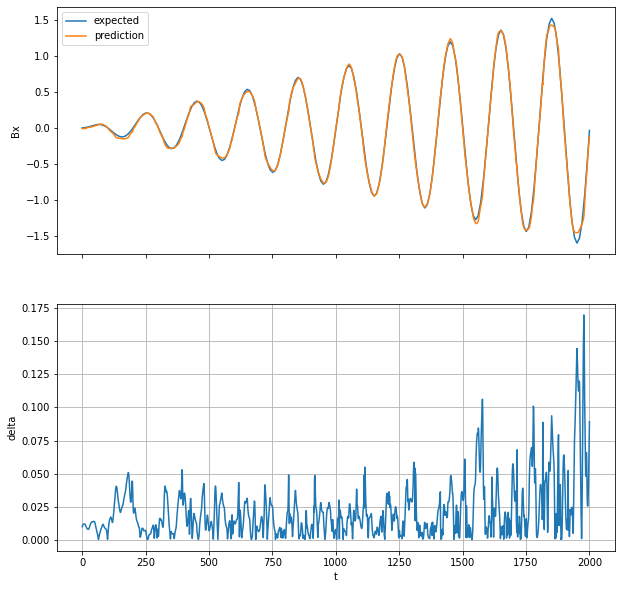

MSE: 0.0009025381461637333


In [44]:
model = tf.keras.models.load_model('./Model_GRU1_Squashed')
pred = inference_loop(model, M19_train_X)
del model

plot_predictions(pred, M19_train_Y, figsize=(10, 10))

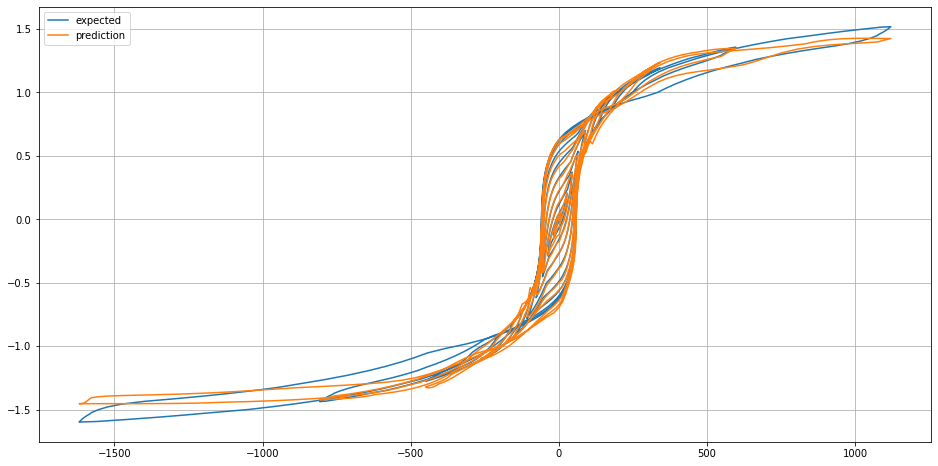

In [45]:
plt.figure(figsize=(16, 8))
plt.plot(M19_train_X[:, -1, 0], M19_train_Y, label='expected')
plt.plot(M19_train_X[:, -1, 0], pred, label='prediction')
plt.grid()
plt.legend()
plt.show()

1/1 [==============================] - 0s 23ms/step
 DONE after 86.42476677894592s


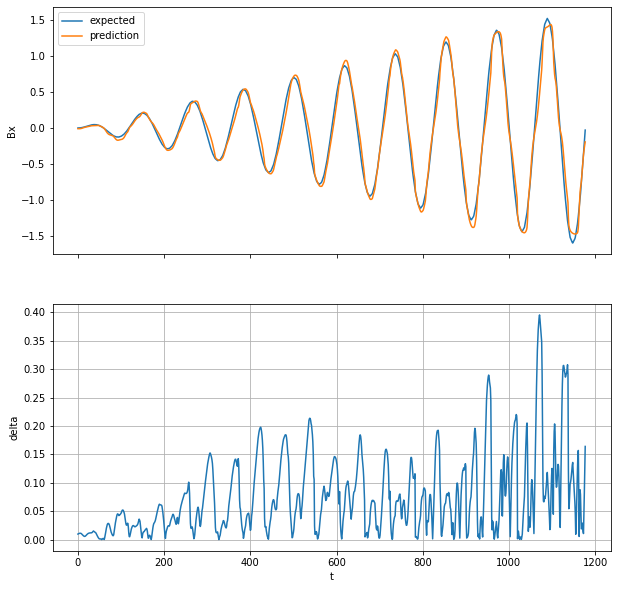

MSE: 0.010512568181636763


In [46]:
model = tf.keras.models.load_model('./Model_GRU1_Squashed')
pred = inference_loop(model, M19_test_X)
del model

plot_predictions(pred, M19_test_Y, figsize=(10, 10))

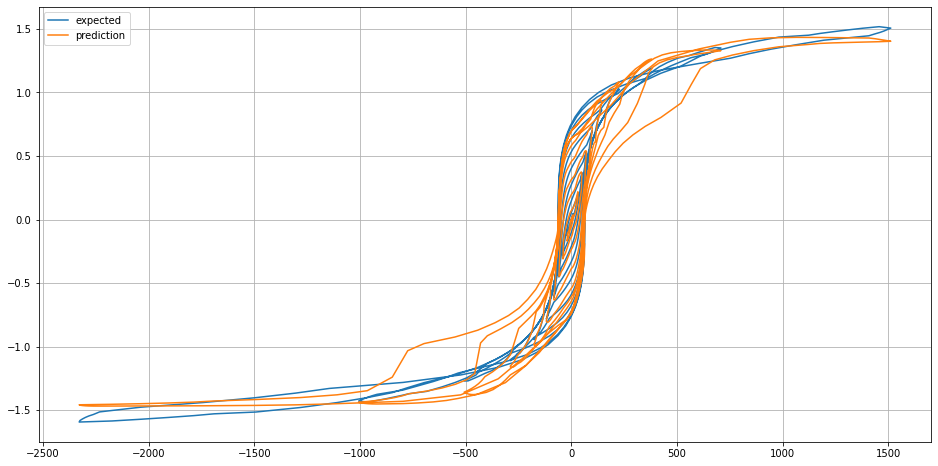

In [47]:
plt.figure(figsize=(16, 8))
plt.plot(M19_test_X[:, -1, 0], M19_test_Y, label='expected')
plt.plot(M19_test_X[:, -1, 0], pred, label='prediction')
plt.grid()
plt.legend()
plt.show()

### M27

1/1 [==============================] - 0s 28ms/step
 DONE after 152.9936990737915s


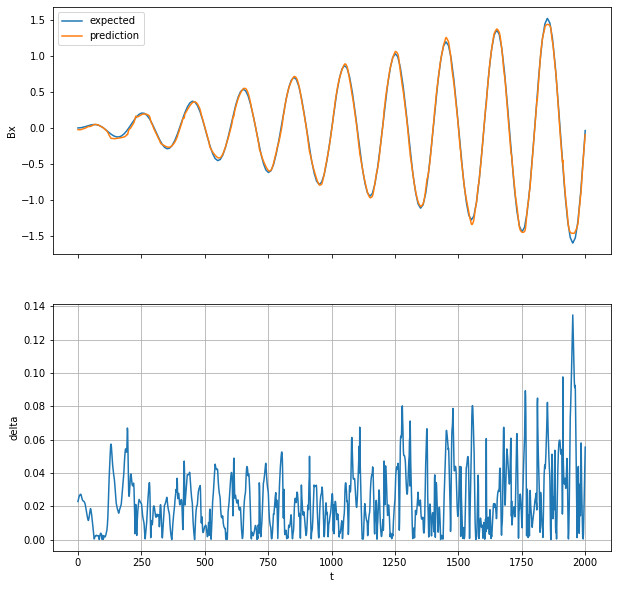

MSE: 0.0009287834805454566


In [48]:
model = tf.keras.models.load_model('./Model_GRU1_Squashed')
pred = inference_loop(model, M27_train_X)
del model

plot_predictions(pred, M27_train_Y, figsize=(10, 10))

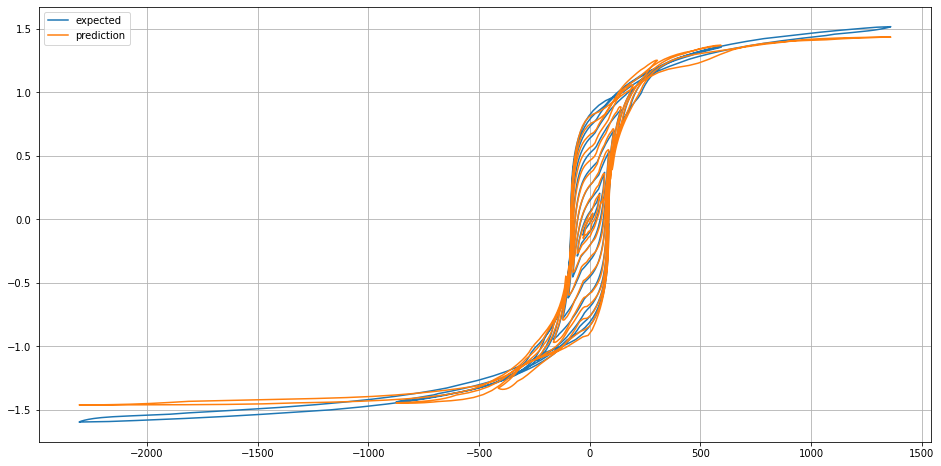

In [49]:
plt.figure(figsize=(16, 8))
plt.plot(M27_train_X[:, -1, 0], M27_train_Y, label='expected')
plt.plot(M27_train_X[:, -1, 0], pred, label='prediction')
plt.grid()
plt.legend()
plt.show()

1/1 [==============================] - 0s 39ms/step
 DONE after 89.77811455726624s


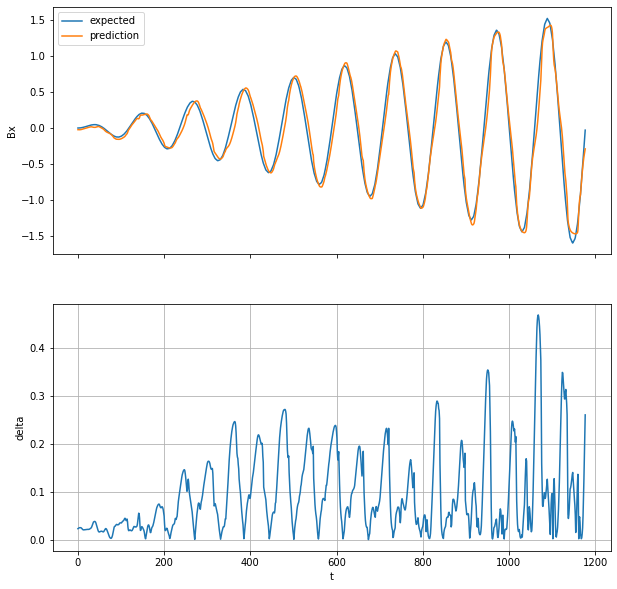

MSE: 0.016169452244799452


In [50]:
model = tf.keras.models.load_model('./Model_GRU1_Squashed')
pred = inference_loop(model, M27_test_X)
del model

plot_predictions(pred, M27_test_Y, figsize=(10, 10))

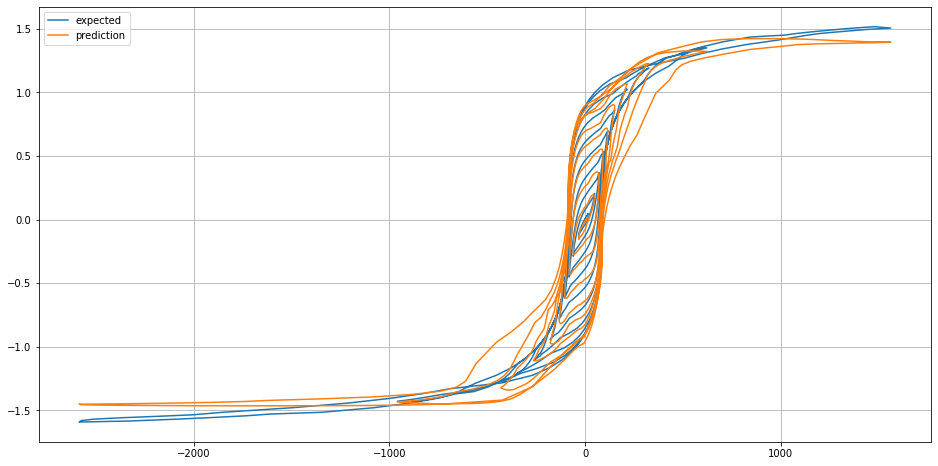

In [51]:
plt.figure(figsize=(16, 8))
plt.plot(M27_test_X[:, -1, 0], M27_test_Y, label='expected')
plt.plot(M27_test_X[:, -1, 0], pred, label='prediction')
plt.grid()
plt.legend()
plt.show()

### 20PNF1500

1/1 [==============================] - 0s 23ms/step
 DONE after 154.9490897655487s


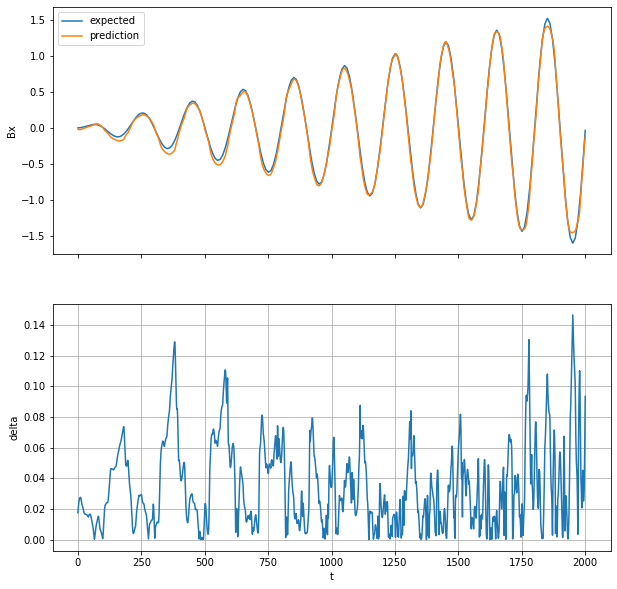

MSE: 0.0019485123545384159


In [52]:
model = tf.keras.models.load_model('./Model_GRU1_Squashed')
pred = inference_loop(model, _20PNF1500_train_X)
del model

plot_predictions(pred, _20PNF1500_train_Y, figsize=(10, 10))

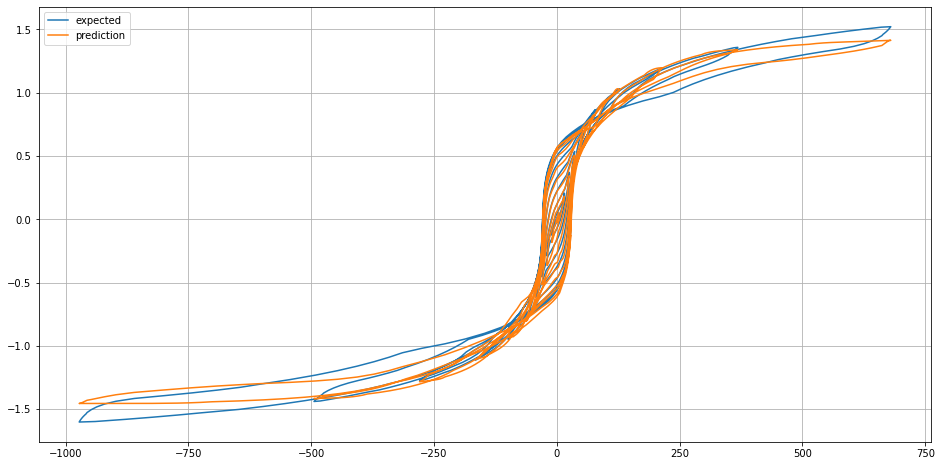

In [53]:
plt.figure(figsize=(16, 8))
plt.plot(_20PNF1500_train_X[:, -1, 0], _20PNF1500_train_Y, label='expected')
plt.plot(_20PNF1500_train_X[:, -1, 0], pred, label='prediction')
plt.grid()
plt.legend()
plt.show()

Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 34ms/step
 DONE after 1106.6691272258759s


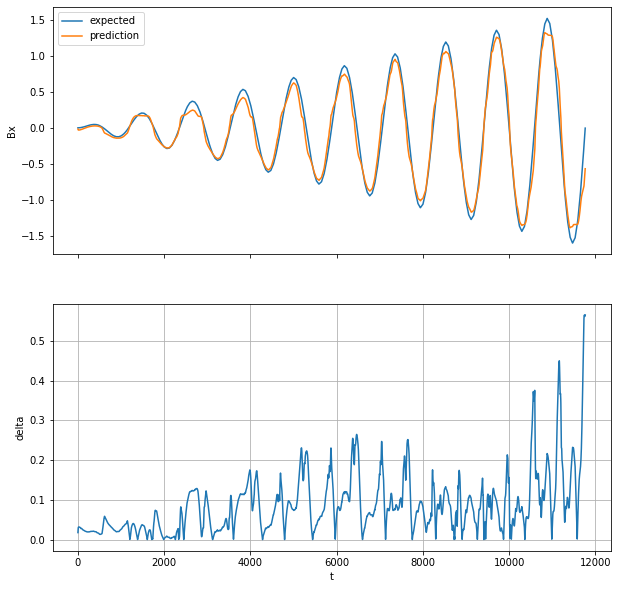

MSE: 0.012932611974011533


In [54]:
model = tf.keras.models.load_model('./Model_GRU1_Squashed')
pred = inference_loop(model, _20PNF1500_test_X)
del model

plot_predictions(pred, _20PNF1500_test_Y, figsize=(10, 10))

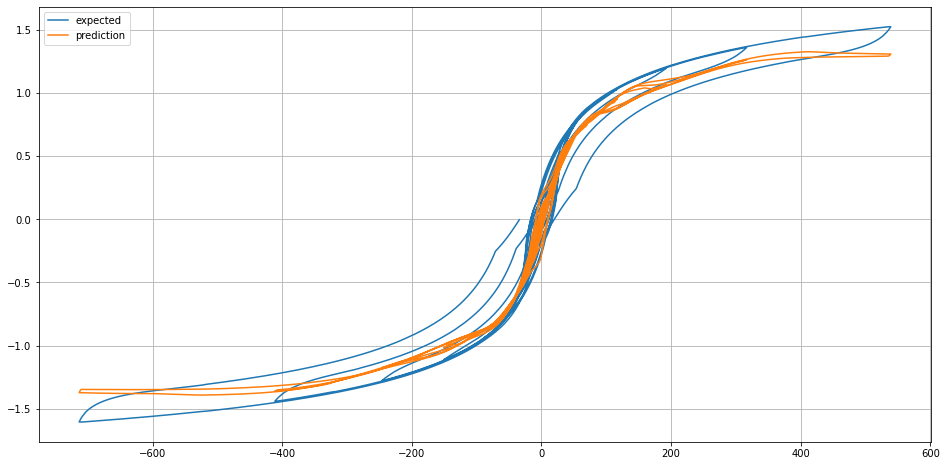

In [55]:
plt.figure(figsize=(16, 8))
plt.plot(_20PNF1500_test_X[:, -1, 0], _20PNF1500_test_Y, label='expected')
plt.plot(_20PNF1500_test_X[:, -1, 0], pred, label='prediction')
plt.grid()
plt.legend()
plt.show()

# The End